### Import Neccessary Libraries

In [1]:
import os
import gc
import re

import cv2
import math
import numpy as np
# import scipy as sp
import pandas as pd

import tensorflow as tf
from IPython.display import SVG
from keras.utils import plot_model
import tensorflow.keras.layers as L
from keras.utils import model_to_dot
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model
# from kaggle_datasets import KaggleDatasets
from tensorflow.keras.applications import DenseNet121
from keras.applications.vgg16 import VGG16

import seaborn as sns
from re import search
from tqdm import tqdm
import matplotlib.cm as cm
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix,ConfusionMatrixDisplay

tqdm.pandas()
# import plotly.express as px
# import plotly.graph_objects as go
# import plotly.figure_factory as ff
# from plotly.subplots import make_subplots

np.random.seed(0)
tf.random.set_seed(0)

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
# IMPORT TENSORFLOW
from tensorflow import keras
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import InceptionResNetV2, InceptionV3
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.regularizers import L1
# from google.colab.patches import cv2_imshow
import os
import shutil
from glob import glob
import glob

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# from tensorflow.python import test
# File paths Using Colab
# train_file_Path = '/content/drive/MyDrive/Apples/images1'

# train_csv ='/content/drive/MyDrive/Apples/train.csv'
# train_df = pd.read_csv(train_csv)

# test_csv = '/content/drive/MyDrive/Apples/test.csv'
# test_df = pd.read_csv(test_csv)

# sub_csv = '/content/drive/MyDrive/Apples/sample_submission.csv'
# sub_df = pd.read_csv(sub_csv)

# # File paths from D drive
train_file_Path = "D:/Applied AI/images"

train_csv ="D:/Applied AI/train.csv"
train_df = pd.read_csv(train_csv)

test_csv = "D:/Applied AI/test.csv"
test_df = pd.read_csv(test_csv)

sub_csv = "D:/Applied AI/sample_submission.csv"
sub_df = pd.read_csv(sub_csv)

# # File paths to G drive
# train_file_Path = "G:/Apples/images"

# train_csv ="G:/Apples/train.csv"
# train_df = pd.read_csv(train_csv)

# test_csv = "G:/Apples/test.csv"
# test_df = pd.read_csv(test_csv)

# sub_csv = "G:/Apples/sample_submission.csv"
# sub_df = pd.read_csv(sub_csv)

In [3]:

train_df.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [4]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1821 entries, 0 to 1820
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image_id  1821 non-null   object
dtypes: object(1)
memory usage: 14.4+ KB


In [5]:
train_df.value_counts()

image_id    healthy  multiple_diseases  rust  scab
Train_0     0        0                  0     1       1
Train_436   0        1                  0     0       1
Train_46    1        0                  0     0       1
Train_459   0        0                  0     1       1
Train_458   0        0                  1     0       1
                                                     ..
Train_1540  0        0                  1     0       1
Train_154   0        0                  0     1       1
Train_1539  1        0                  0     0       1
Train_1538  1        0                  0     0       1
Train_999   0        0                  1     0       1
Length: 1821, dtype: int64

In [6]:
train_df.isna().sum()

image_id             0
healthy              0
multiple_diseases    0
rust                 0
scab                 0
dtype: int64

In [7]:
train_df.nunique()

image_id             1821
healthy                 2
multiple_diseases       2
rust                    2
scab                    2
dtype: int64

In [8]:
train_df.columns

Index(['image_id', 'healthy', 'multiple_diseases', 'rust', 'scab'], dtype='object')

In [9]:
# train_df.drop(['healthy', 'multiple_diseases', 'rust', 'scab'])

In [10]:
train_df['healthy'] = train_df['healthy'].replace({0: False, 1: True})
train_df['multiple_diseases'] = train_df['multiple_diseases'].replace({0: False, 1: True})
train_df['rust'] = train_df['rust'].replace({0: False, 1: True})
train_df['scab'] = train_df['scab'].replace({0: False, 1: True})

In [11]:
a = train_df[train_df['image_id'] == 'Train_1599']
a


,image_id,healthy,multiple_diseases,rust,scab
1599,Train_1599,False,False,True,False


In [13]:
# Colab file path
# shutil.os.mkdir('/content/drive/MyDrive/Apples/images1/train')
# shutil.os.mkdir('/content/drive/MyDrive/Apples/images1/train/healthy')
# shutil.os.mkdir('/content/drive/MyDrive/Apples/images1/train/multiple_diseases')
# shutil.os.mkdir('/content/drive/MyDrive/Apples/images1/train/rust')
# shutil.os.mkdir('/content/drive/MyDrive/Apples/images1/train/scab')

# shutil.os.mkdir('/content/drive/MyDrive/Apples/images1/test')

shutil.os.mkdir("D:/Applied AI/train")
shutil.os.mkdir("D:/Applied AI/train/healthy")
shutil.os.mkdir("D:/Applied AI/train/multiple_diseases")
shutil.os.mkdir("D:/Applied AI/train/rust")
shutil.os.mkdir("D:/Applied AI/train/scab")

shutil.os.mkdir("D:/Applied AI/test")

# G drive file path
# shutil.os.mkdir("G:/Apples/train")
# shutil.os.mkdir("G:/Apples/train/healthy")
# shutil.os.mkdir("G:/Apples/train/multiple_diseases")
# shutil.os.mkdir("G:/Apples/train/rust")
# shutil.os.mkdir("G:/Apples/train/scab")

# shutil.os.mkdir("G:/Apples/test")

In [14]:
# colab file path
# healthy_dir = '/content/drive/MyDrive/Apples/train/healthy'
# multiple_disease_dir =  '/content/drive/MyDrive/Apples/train/multiple_diseases'
# rust_dir = '/content/drive/MyDrive/Apples/train/rust'
# scab_dir ='/content/drive/MyDrive/Apples/train/scab'
# test_dir = '/content/drive/MyDrive/Apples/test'

# file path to D drive
healthy_dir = r"D:/Applied AI/train/healthy"
multiple_disease_dir = "D:/Applied AI/train/multiple_diseases"
rust_dir = r"D:/Applied AI/train/rust"
scab_dir = r"D:/Applied AI/train/scab"
test_dir = r"D:/Applied AI/test"

# file from G drive
# healthy_dir = "G:/Apples/train/healthy"
# multiple_disease_dir = "G:/Apples/train/multiple_diseases"
# rust_dir = "G:/Apples/train/rust"
# scab_dir = "G:/Apples/train/scab"
# test_dir = "G:/Apples/test"

In [15]:
from pathlib import Path


folder_path = Path(train_file_Path)  # Replace with the actual path of the folder
print(folder_path)
# for item in folder_path.iterdir():
#     print(folder_path)
# #     image_name = item.name

D:\Applied AI\images


In [16]:

from pathlib import Path

folder_path = Path(train_file_Path)  # Replace with the actual path of the folder

for item in folder_path.iterdir():
    print(item)
#     image_name = item.name
    image_name = (str(item).split(r'images\\')[1])
    print(image_name)

    if str(image_name).split('_')[0] == 'Test':
        print('okay')
        shutil.move(item, test_dir)
    else:
        if list(train_df[train_df['image_id'] == str(image_name).split('.')[0]]['multiple_diseases'].to_dict().values())[0] == True:
            destination_file = os.path.join(multiple_disease_dir, image_name)
            shutil.move(item, destination_file)

        if list(train_df[train_df['image_id'] == str(image_name).split('.')[0]]['healthy'].to_dict().values())[0] == True:
            destination_file = os.path.join(healthy_dir, image_name)
            shutil.move(item, destination_file)

        if list(train_df[train_df['image_id'] == str(image_name).split('.')[0]]['rust'].to_dict().values())[0] == True:
            destination_file = os.path.join(rust_dir, image_name)
            shutil.move(item, destination_file)

        if list(train_df[train_df['image_id'] == str(image_name).split('.')[0]]['scab'].to_dict().values())[0] == True:
            destination_file = os.path.join(scab_dir, image_name)
            shutil.move(item, destination_file)



In [15]:
# for item in folder_path.iterdir():
#   print(item)

## Data Proprocessing

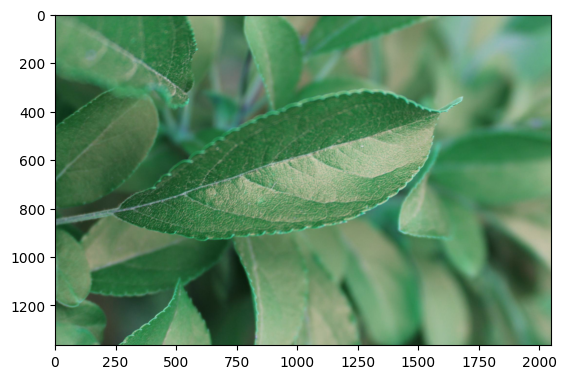

In [17]:
# d Drive file path
train_dir = "D:/Applied AI/train"

# colab file path
# train_dir = '/content/drive/MyDrive/Apples/train'

# G drive file path
# train_dir = "G:/Apples/train"

categories = ['healthy', 'multiple_diseases', 'rust', 'scab']

for i in categories:
    path = os.path.join(train_dir, i)
    for img in os.listdir(path):
        image_list = cv2.imread(os.path.join(path,img ), cv2.COLOR_BGR2RGB)
        
        
        plt.imshow(image_list)
        plt.show()
        break
    break

In [18]:
len(image_list)

1365

In [19]:
# for img_name in image_list[:10]:
#     plt.imshow(img_name)
#     plt.title(i)
#     plt.axis('off')
#     plt.show()

## Resize Images

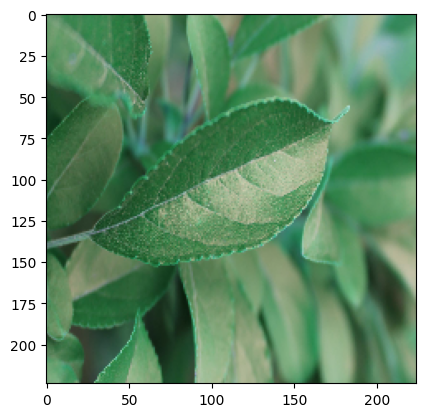

In [20]:
img_size = 224
resized_img = cv2.resize(image_list, (img_size, img_size))
plt.imshow(resized_img)
plt.show()

In [21]:
len(resized_img)

224

In [22]:
resized_img.shape

(224, 224, 3)

## Model Preparation

In [23]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Activation, Flatten, Conv2D, MaxPooling2D


In [24]:
dataset = "D:/Applied AI/train"

In [31]:
 # data Normalization and Augumentation
batch_size = 16
data_gen = ImageDataGenerator(rescale=1./255, shear_range = 0.2, zoom_range=0.2,
                                    horizontal_flip=True, vertical_flip=True, rotation_range=20, validation_split=0.2)

train_datagen = data_gen.flow_from_directory("D:/Applied AI/train",
                                             target_size= (img_size, img_size), batch_size = batch_size,
                                             class_mode = 'categorical', subset = 'training')

val_datagen = data_gen.flow_from_directory("D:/Applied AI/train",
                                             target_size= (img_size, img_size), batch_size = batch_size,
                                             class_mode = 'categorical', subset = 'validation')

Found 1458 images belonging to 4 classes.
Found 363 images belonging to 4 classes.


In [36]:
#  # data Normalization
# data_gen = ImageDataGenerator(rescale=1./255, shear_range = 0.2, zoom_range=0.2,
#                                     horizontal_flip=True, vertical_flip=True, rotation_range=20, validation_split=0.2)

# train_datagen = data_gen.flow_from_directory('/content/drive/MyDrive/Apples/train',
#                                              target_size= (img_size, img_size), batch_size = 16,
#                                              class_mode = 'categorical', subset = 'training')

# val_datagen = data_gen.flow_from_directory('/content/drive/MyDrive/Apples/train',
#                                              target_size= (img_size, img_size), batch_size = 16,
#                                              class_mode = 'categorical', subset = 'validation')

In [37]:
 # data Normalization
# file path from G drive
# data_gen = ImageDataGenerator(rescale=1./255, shear_range = 0.2, zoom_range=0.2,
#                                     horizontal_flip=True, vertical_flip=True, rotation_range=20, validation_split=0.2)

# train_datagen = data_gen.flow_from_directory(train_dir,
#                                              target_size= (img_size, img_size), batch_size = 16,
#                                              class_mode = 'categorical', subset = 'training')

# val_datagen = data_gen.flow_from_directory(train_dir,
#                                              target_size= (img_size, img_size), batch_size = 16,
#                                              class_mode = 'categorical', subset = 'validation')

In [54]:
test_imgs = []
test_labels = []

# spliting the validation data by 20 % because the original test data has no labels
test_batches = int(len(val_datagen) * 0.2)

#loop through test batches to get labels and img
for i in range(test_batches):
    img, label = next(val_datagen)
    test_imgs.extend(img)  
    test_labels.extend(np.argmax(label, axis=1))

    
test_imgs = np.array(test_imgs)
test_labels = np.array(test_labels)

In [ ]:
# clear session so model learns well
from tensorflow.keras import backend
backend.clear_session()

### VGG 16 Model

In [26]:
# Loading the VGG model without the top classifier layers
vgg = VGG16(weights='imagenet', include_top=False, input_shape=(img_size, img_size, 3))

for layer in vgg.layers:
    layer.trainable = False

58889256/58889256 [==============================] - 2s 0us/step


In [27]:
model_vgg = Sequential()
model_vgg.add(vgg)
model_vgg.add(Flatten())
model_vgg.add(Dense(4,activation="softmax"))
model_vgg.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 4)                 100356    
                                                                 
Total params: 14,815,044
Trainable params: 100,356
Non-trainable params: 14,714,688
_________________________________________________________________


In [28]:
# comile the model
model_vgg.compile(optimizer='Adam', loss= 'categorical_crossentropy', metrics=['accuracy'],)

In [29]:
checkpoint = ModelCheckpoint("D:/Applied AI/train/models/vgg16.h5",monitor="val_acc",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_acc",patience=5,verbose=1)



history_vgg = model_vgg.fit(train_datagen,epochs=30, validation_data=val_datagen, verbose=1, callbacks=[checkpoint, earlystop])

Epoch 1/30
92/92 [==============================] - 55s 512ms/step - loss: 1.4590 - accuracy: 0.4986 - val_loss: 0.9543 - val_accuracy: 0.6667
Epoch 2/30
92/92 [==============================] - 20s 222ms/step - loss: 0.8959 - accuracy: 0.6626 - val_loss: 1.0467 - val_accuracy: 0.6309
Epoch 3/30
92/92 [==============================] - 21s 224ms/step - loss: 0.9187 - accuracy: 0.6639 - val_loss: 0.9079 - val_accuracy: 0.6694
Epoch 4/30
92/92 [==============================] - 24s 262ms/step - loss: 0.8033 - accuracy: 0.7030 - val_loss: 0.8976 - val_accuracy: 0.7383
Epoch 5/30
92/92 [==============================] - 28s 306ms/step - loss: 0.8343 - accuracy: 0.6989 - val_loss: 0.9823 - val_accuracy: 0.6722
Epoch 6/30
92/92 [==============================] - 21s 223ms/step - loss: 0.8176 - accuracy: 0.7119 - val_loss: 0.9901 - val_accuracy: 0.6804
Epoch 7/30
92/92 [==============================] - 21s 224ms/step - loss: 0.7153 - accuracy: 0.7462 - val_loss: 1.0639 - val_accuracy: 0.6639

Epoch 19/30
92/92 [==============================] - 21s 226ms/step - loss: 0.4753 - accuracy: 0.8292 - val_loss: 1.0743 - val_accuracy: 0.7107
Epoch 20/30
92/92 [==============================] - 21s 226ms/step - loss: 0.5119 - accuracy: 0.8210 - val_loss: 1.0204 - val_accuracy: 0.6804
Epoch 21/30
92/92 [==============================] - 21s 229ms/step - loss: 0.5370 - accuracy: 0.8155 - val_loss: 1.0170 - val_accuracy: 0.6915
Epoch 22/30
92/92 [==============================] - 21s 227ms/step - loss: 0.5855 - accuracy: 0.7936 - val_loss: 1.3375 - val_accuracy: 0.6198
Epoch 23/30
92/92 [==============================] - 21s 224ms/step - loss: 0.5837 - accuracy: 0.7963 - val_loss: 1.1057 - val_accuracy: 0.6915
Epoch 24/30
92/92 [==============================] - 21s 226ms/step - loss: 0.5310 - accuracy: 0.8059 - val_loss: 1.1722 - val_accuracy: 0.6749
Epoch 25/30
92/92 [==============================] - 21s 225ms/step - loss: 0.5068 - accuracy: 0.8237 - val_loss: 1.4199 - val_accuracy:

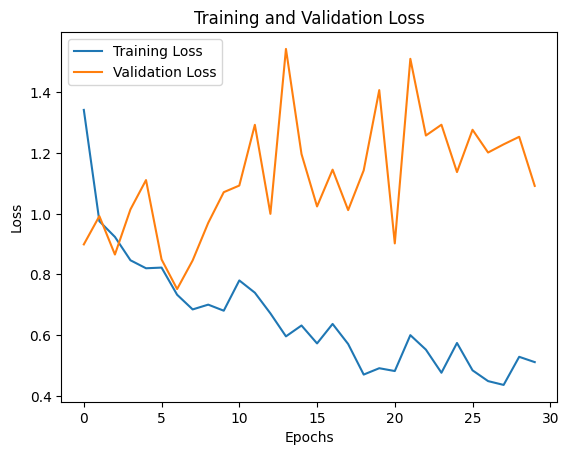

In [33]:
#check for overfitting
#plot training against validation loss
plt.plot(history_vgg.history['loss'], label= 'Training Loss')

#Plots the validation loss as a line with label "Validation Loss".
plt.plot(history_vgg.history['val_loss'], label='Validation Loss')

#Sets the title of the plot to "Training and Validation Loss".
plt.title('Training and Validation Loss')

#Sets the label of the x-axis to "Epochs".
plt.xlabel('Epochs')

#Sets the label of the y-axis to "Loss".
plt.ylabel('Loss')

#Shows the legend of the plot with the labels of the two lines.
plt.legend()

#Shows the plot on the screen.
plt.show()

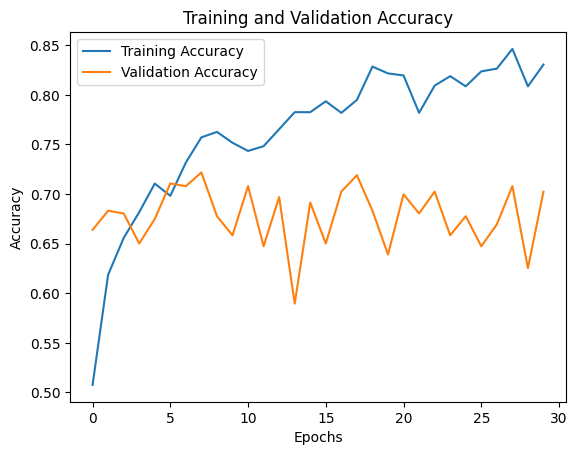

In [34]:
# Plot training and validation accuracy

#Plots the training accuracy as a line with label "Training Accuracy".
plt.plot(history_vgg.history['accuracy'], label='Training Accuracy')

#Plots the validation accuracy as a line with label "Validation Accuracy".
plt.plot(history_vgg.history['val_accuracy'], label='Validation Accuracy')

#Sets the title of the plot to "Training and Validation Accuracy".
plt.title('Training and Validation Accuracy')

#Sets the label of the x-axis to "Epochs".
plt.xlabel('Epochs')

#Sets the label of the y-axis to "Accuracy".
plt.ylabel('Accuracy')

#Shows the legend of the plot with the labels of the two lines.
plt.legend()

#Shows the plot on the screen.
plt.show()

In [53]:
# Apply Trianed model on test data
predictions = model_vgg.predict(test_imgs)

# convert predictions to predicted labels
predicted_labels = np.argmax(predictions, axis = 1)

# check accuracy of prediction against true labels
accuracy = np.mean(predicted_labels == test_labels)
print(f' Accuracy: {accuracy * 100: .2f}%')

2/2 [==============================] - 2s 593ms/step
 Accuracy:  71.19%


In [64]:
# Apply model_vgg to predict test images
predictions = model_vgg.predict(test_imgs)

# Convert predicted probabilities to predicted labels
predicted_labels = np.argmax(predictions, axis=1)
class_label = ['healthy', 'multiple_diseases', 'rust', 'scab']
# Calculate the classification report
class_report = classification_report(test_labels, predicted_labels, target_names=class_label)

# Print the classification report
print("Classification Report:\n", class_report)

2/2 [==============================] - 0s 315ms/step
Classification Report:
                    precision    recall  f1-score   support

          healthy       0.72      0.62      0.67        21
multiple_diseases       0.00      0.00      0.00         1
             rust       0.69      0.69      0.69        29
             scab       0.59      0.77      0.67        13

         accuracy                           0.67        64
        macro avg       0.50      0.52      0.51        64
     weighted avg       0.67      0.67      0.67        64



In [59]:
# predicted_labels = []
# true_labels = []

# # Specify the number of batches or steps based on your validation data size and batch size
# steps = len(val_datagen)
# # print(steps)

# for i in range(steps):
#     img, lb = next(val_datagen)
#     true_labels.extend(np.argmax(lb, axis=1))  # Convert one-hot labels to categorical labels
#     preds = model_vgg.predict(img)
#     pred = [np.argmax(x) for x in preds]
#     predicted_labels.extend(pred)

In [61]:
# # classification report for VGG16
# class_label = ['healthy', 'multiple_diseases', 'rust', 'scab']
# class_report = (classification_report(predicted_labels, true_labels, target_names = class_label))
# print('classification_report-VGG 16:\n', class_report)

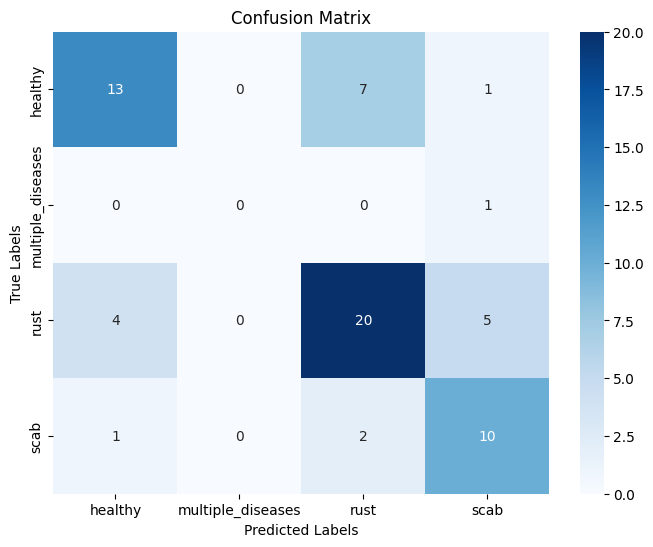

In [67]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the confusion matrix
conf_matrix = confusion_matrix(test_labels, predicted_labels)

# Define class labels (replace with your actual class labels)
class_label = ['healthy', 'multiple_diseases', 'rust', 'scab']

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_label, yticklabels=class_label)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

### Making Prediction

1/1 [==============================] - 1s 668ms/step
Test Image 1: Predicted Class = rust


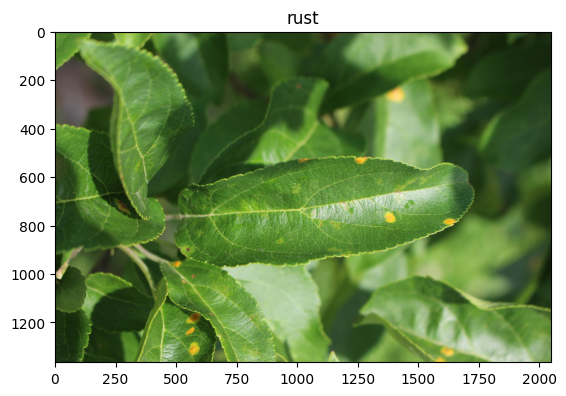

1/1 [==============================] - 0s 16ms/step
Test Image 2: Predicted Class = rust


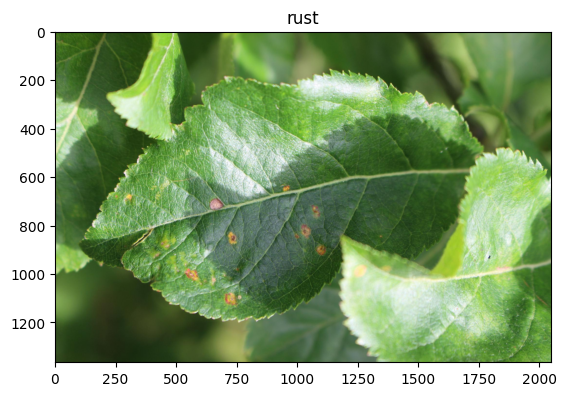

1/1 [==============================] - 0s 9ms/step
Test Image 3: Predicted Class = healthy


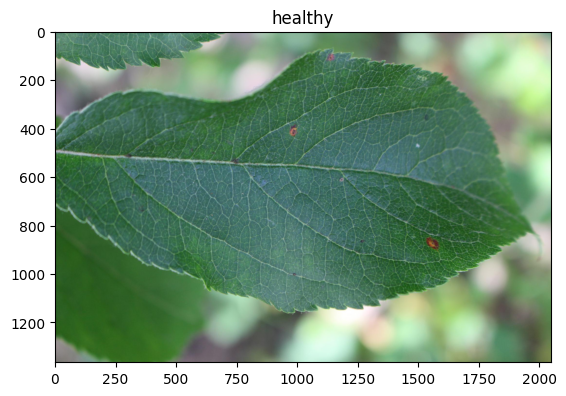

1/1 [==============================] - 0s 10ms/step
Test Image 4: Predicted Class = scab


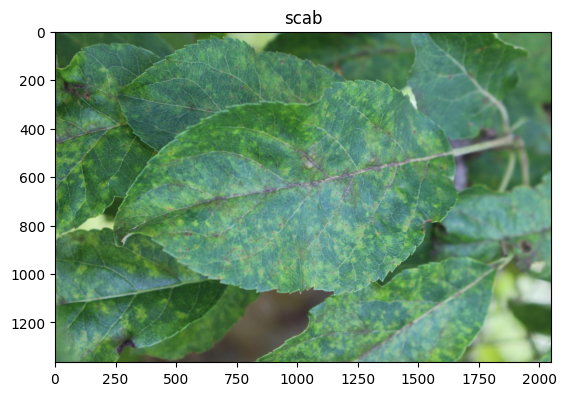

1/1 [==============================] - 0s 10ms/step
Test Image 5: Predicted Class = rust


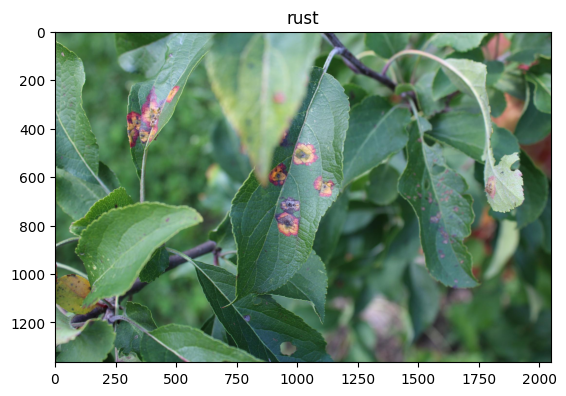

1/1 [==============================] - 0s 14ms/step
Test Image 6: Predicted Class = rust


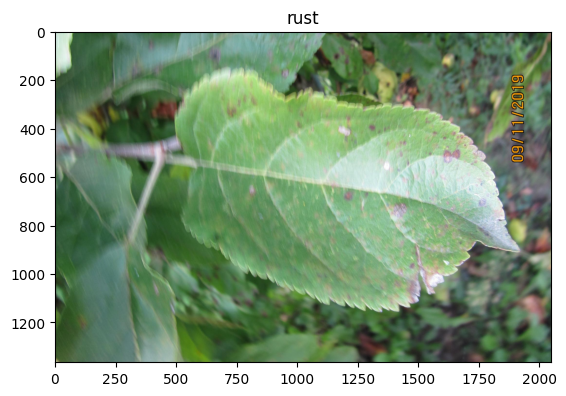

1/1 [==============================] - 0s 11ms/step
Test Image 7: Predicted Class = rust


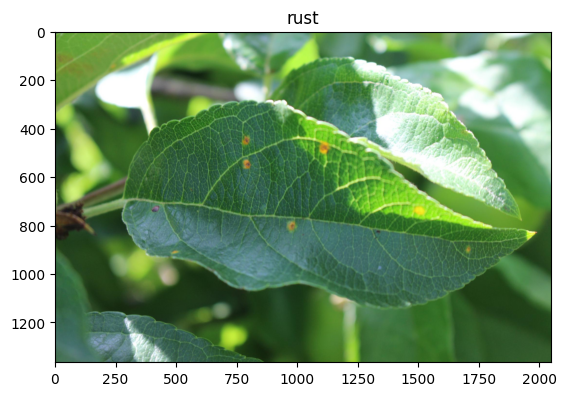

1/1 [==============================] - 0s 8ms/step
Test Image 8: Predicted Class = rust


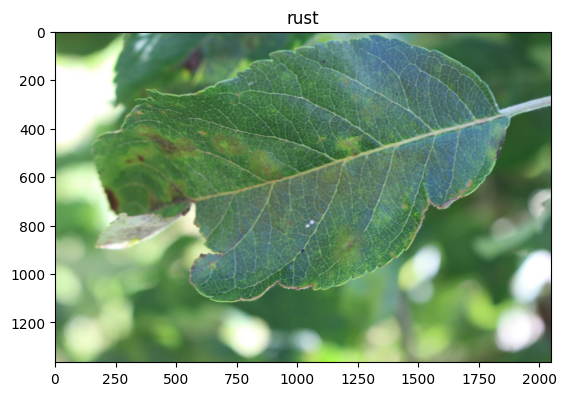

1/1 [==============================] - 0s 10ms/step
Test Image 9: Predicted Class = healthy


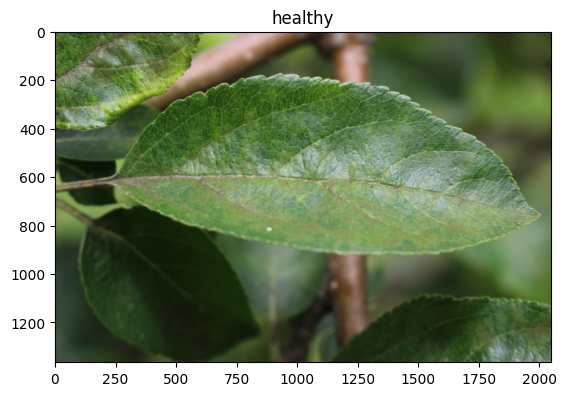

1/1 [==============================] - 0s 0s/step
Test Image 10: Predicted Class = healthy


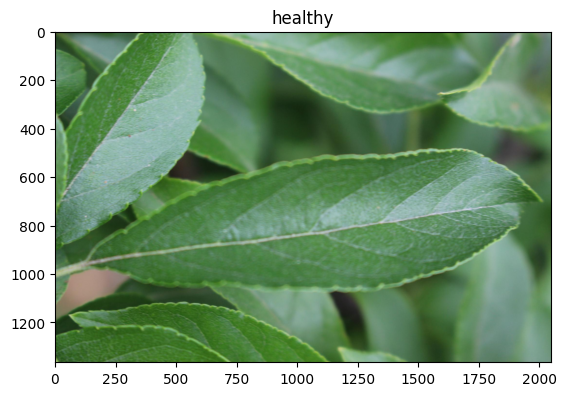

In [35]:
# Update 'categories' list with four class names
from tensorflow.keras.preprocessing import image
from PIL import Image
from pathlib import Path
from keras.preprocessing.image import ImageDataGenerator

categories = ['healthy', 'multiple_diseases', 'rust', 'scab']

test_dir = r"D:/Applied AI/test"
ground_truth_labels = []  # To store the actual class labels
predicted_labels = []  # To store the predicted class labels

num_images_to_display = 10  # Number of images to display and predict

for idx, img_path in enumerate(os.listdir(test_dir)):
    if idx >= num_images_to_display:
        break
    
    file_path = os.path.join(test_dir, img_path)
    test_img = image.load_img(file_path, target_size=(224, 224))
    test_img = image.img_to_array(test_img)
    test_img = test_img / 255
    test_img = np.expand_dims(test_img, axis=0)
    
    # Get the ground truth label from the image filename
    true_label = img_path.split("_")[0]  # Assuming the filenames are like 'class_imageID.jpg'
    ground_truth_labels.append(true_label)
    
    result = np.argmax(model_vgg.predict(test_img), axis=-1)
    predicted_class = categories[result[0]]
    predicted_labels.append(predicted_class)
    
    print(f"Test Image {idx + 1}: Predicted Class = {predicted_class}")

    # Load and display the test image
    image_result = Image.open(file_path)
    plt.imshow(image_result)
    plt.title(predicted_class)
    plt.show()



## Inception V3

In [54]:
batch_size = 16
train_datagen = tf.keras.preprocessing.image_dataset_from_directory(dataset,
                                                               validation_split=0.2,
                                                               subset="training",
                                                               seed=123,
                                                               image_size=(224, 224),
                                                               batch_size=batch_size)

val_datagen = tf.keras.preprocessing.image_dataset_from_directory(dataset,
                                                             validation_split=0.2,
                                                             subset="validation",
                                                             seed=123,
                                                             image_size=(224, 224),
                                                             batch_size=batch_size)


Found 1821 files belonging to 4 classes.
Using 1457 files for training.
Found 1821 files belonging to 4 classes.
Using 364 files for validation.


In [55]:
# train_datagen_v3 = tf.keras.preprocessing.image_dataset_from_directory(dataset,
#                                                                validation_split=0.2,
#                                                                subset="training",
#                                                                seed=123,
#                                                                image_size=(299, 299),
#                                                                batch_size=16, class_mode= 'categorical')

# val_datagen_v3 = tf.keras.preprocessing.image_dataset_from_directory(dataset,
#                                                              validation_split=0.2,
#                                                              subset="validation",
#                                                              seed=123,
#                                                              image_size=(299, 299),
#                                                              batch_size=16, class_mode= 'categorical')

In [79]:
train_datagen_v3 = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(224, 224),
    batch_size=16,
    label_mode="categorical",  # This will automatically one-hot encode the labels
    shuffle=True)

val_datagen_v3 = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(224, 224),
    batch_size=16,
    label_mode="categorical",  # This will automatically one-hot encode the labels
    shuffle=False)  # No need to shuffle the validation set

# Preprocess and batch the data
AUTOTUNE = tf.data.experimental.AUTOTUNE

train_datagen_v3 = train_datagen_v3.map(
    lambda x, y: (tf.keras.applications.inception_v3.preprocess_input(x), y),
    num_parallel_calls=AUTOTUNE).cache().prefetch(buffer_size=AUTOTUNE)

val_datagen_v3 = val_datagen_v3.map(
    lambda x, y: (tf.keras.applications.inception_v3.preprocess_input(x), y),
    num_parallel_calls=AUTOTUNE).cache().prefetch(buffer_size=AUTOTUNE)

Found 1821 files belonging to 4 classes.
Using 1457 files for training.
Found 1821 files belonging to 4 classes.
Using 364 files for validation.


In [36]:
#  Create the base Inception V3 model with pre-trained weights
inception_model =  tf.keras.applications.inception_v3.InceptionV3(include_top=False,
                                                                 weights='imagenet',
                                                                 input_tensor=None,
                                                                 input_shape=(224, 224,3),
                                                                 pooling=None,
                                                                 classes=1000,
                                                                 classifier_activation='softmax')

In [37]:
inception_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                      

 batch_normalization_5 (BatchNo  (None, 25, 25, 64)  192         ['conv2d_5[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 25, 25, 64)  192         ['conv2d_7[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_10 (BatchN  (None, 25, 25, 96)  288         ['conv2d_10[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_11 (BatchN  (None, 25, 25, 32)  96          ['conv2d_11[0][0]']              
 ormalizat

                                                                                                  
 batch_normalization_22 (BatchN  (None, 25, 25, 64)  192         ['conv2d_22[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_22 (Activation)     (None, 25, 25, 64)   0           ['batch_normalization_22[0][0]'] 
                                                                                                  
 conv2d_20 (Conv2D)             (None, 25, 25, 48)   13824       ['mixed1[0][0]']                 
                                                                                                  
 conv2d_23 (Conv2D)             (None, 25, 25, 96)   55296       ['activation_22[0][0]']          
                                                                                                  
 batch_nor

                                                                                                  
 max_pooling2d_2 (MaxPooling2D)  (None, 12, 12, 288)  0          ['mixed2[0][0]']                 
                                                                                                  
 mixed3 (Concatenate)           (None, 12, 12, 768)  0           ['activation_26[0][0]',          
                                                                  'activation_29[0][0]',          
                                                                  'max_pooling2d_2[0][0]']        
                                                                                                  
 conv2d_34 (Conv2D)             (None, 12, 12, 128)  98304       ['mixed3[0][0]']                 
                                                                                                  
 batch_normalization_34 (BatchN  (None, 12, 12, 128)  384        ['conv2d_34[0][0]']              
 ormalizat

                                                                  'activation_39[0][0]']          
                                                                                                  
 conv2d_44 (Conv2D)             (None, 12, 12, 160)  122880      ['mixed4[0][0]']                 
                                                                                                  
 batch_normalization_44 (BatchN  (None, 12, 12, 160)  480        ['conv2d_44[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_44 (Activation)     (None, 12, 12, 160)  0           ['batch_normalization_44[0][0]'] 
                                                                                                  
 conv2d_45 (Conv2D)             (None, 12, 12, 160)  179200      ['activation_44[0][0]']          
          

 ormalization)                                                                                    
                                                                                                  
 activation_54 (Activation)     (None, 12, 12, 160)  0           ['batch_normalization_54[0][0]'] 
                                                                                                  
 conv2d_55 (Conv2D)             (None, 12, 12, 160)  179200      ['activation_54[0][0]']          
                                                                                                  
 batch_normalization_55 (BatchN  (None, 12, 12, 160)  480        ['conv2d_55[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_55 (Activation)     (None, 12, 12, 160)  0           ['batch_normalization_55[0][0]'] 
          

                                                                                                  
 batch_normalization_65 (BatchN  (None, 12, 12, 192)  576        ['conv2d_65[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_65 (Activation)     (None, 12, 12, 192)  0           ['batch_normalization_65[0][0]'] 
                                                                                                  
 conv2d_61 (Conv2D)             (None, 12, 12, 192)  147456      ['mixed6[0][0]']                 
                                                                                                  
 conv2d_66 (Conv2D)             (None, 12, 12, 192)  258048      ['activation_65[0][0]']          
                                                                                                  
 batch_nor

                                                                                                  
 conv2d_70 (Conv2D)             (None, 12, 12, 192)  147456      ['mixed7[0][0]']                 
                                                                                                  
 conv2d_74 (Conv2D)             (None, 12, 12, 192)  258048      ['activation_73[0][0]']          
                                                                                                  
 batch_normalization_70 (BatchN  (None, 12, 12, 192)  576        ['conv2d_70[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_74 (BatchN  (None, 12, 12, 192)  576        ['conv2d_74[0][0]']              
 ormalization)                                                                                    
          

 batch_normalization_76 (BatchN  (None, 5, 5, 320)   960         ['conv2d_76[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_78 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_78[0][0]'] 
                                                                                                  
 activation_79 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_79[0][0]'] 
                                                                                                  
 activation_82 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_82[0][0]'] 
                                                                                                  
 activation_83 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_83[0][0]'] 
          

                                                                                                  
 activation_91 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_91[0][0]'] 
                                                                                                  
 activation_92 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_92[0][0]'] 
                                                                                                  
 batch_normalization_93 (BatchN  (None, 5, 5, 192)   576         ['conv2d_93[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_85 (Activation)     (None, 5, 5, 320)    0           ['batch_normalization_85[0][0]'] 
                                                                                                  
 mixed9_1 

In [38]:
# To determine the number of layers in the Model

print(f"""Number of layers in the incetionv3 model: {len(inception_model.layers)}""" )

Number of layers in the incetionv3 model: 311


In [39]:
# inception_model.compile(optimizer=Adam(learning_rate = 0.0001), loss= 'categorical_crossentropy', metrics=['accuracy'])

In [40]:
#  freeze all other layers
inception_model.trainable = False

In [41]:


#  specify input size
inputs = tf.keras.Input(shape=(224, 224, 3))
#  define resnet layers
x = inception_model(inputs, training=False)

#  attach dropout layer
x = tf.keras.layers.Dropout(0.2)(x)

#  define prediction layer to produce 4 element output vector
prediction_layer = tf.keras.layers.Dense(4 , activation='softmax')(x)

#  attach prediction layer
outputs = prediction_layer

#  put model together
v3_model = tf.keras.Model(inputs, outputs)


In [42]:
# Declare optimizer categorical_crossentropy tf.keras.losses.SparseCategoricalCrossentropy()
adam = Adam(learning_rate=0.0001)

# Compile the model
v3_model.compile(optimizer=adam, loss= 'categorical_crossentropy', metrics=['accuracy'])

In [43]:
# inceptV3_model.summary()

In [44]:
print(f"""Number of layers in the incetionv3 model: {len(v3_model.layers)}""" )

Number of layers in the incetionv3 model: 4


In [80]:
v3_model_history = v3_model.fit(train_datagen, validation_data = val_datagen, epochs= 30, callbacks=[checkpoint, earlystop])

Epoch 1/30


ValueError: in user code:

    File "C:\Program Files\Python310\lib\site-packages\keras\engine\training.py", line 1051, in train_function  *
        return step_function(self, iterator)
    File "C:\Program Files\Python310\lib\site-packages\keras\engine\training.py", line 1040, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Program Files\Python310\lib\site-packages\keras\engine\training.py", line 1030, in run_step  **
        outputs = model.train_step(data)
    File "C:\Program Files\Python310\lib\site-packages\keras\engine\training.py", line 890, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "C:\Program Files\Python310\lib\site-packages\keras\engine\training.py", line 948, in compute_loss
        return self.compiled_loss(
    File "C:\Program Files\Python310\lib\site-packages\keras\engine\compile_utils.py", line 201, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "C:\Program Files\Python310\lib\site-packages\keras\losses.py", line 139, in __call__
        losses = call_fn(y_true, y_pred)
    File "C:\Program Files\Python310\lib\site-packages\keras\losses.py", line 243, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "C:\Program Files\Python310\lib\site-packages\keras\losses.py", line 1787, in categorical_crossentropy
        return backend.categorical_crossentropy(
    File "C:\Program Files\Python310\lib\site-packages\keras\backend.py", line 5119, in categorical_crossentropy
        target.shape.assert_is_compatible_with(output.shape)

    ValueError: Shapes (None, None) and (None, 5, 5, 4) are incompatible


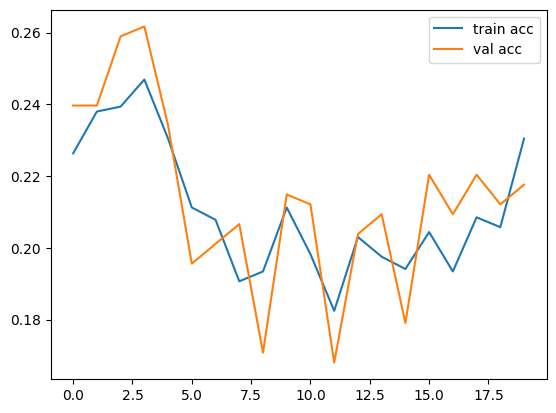

<Figure size 640x480 with 0 Axes>

In [126]:
# plot the accuracy
plt.plot(v3_model_history.history['accuracy'], label='train acc')
plt.plot(v3_model_history.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')

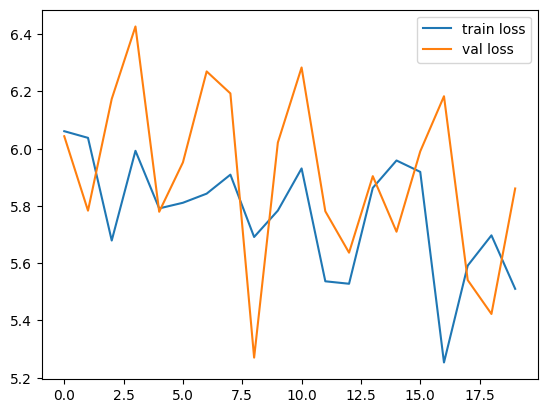

<Figure size 640x480 with 0 Axes>

In [127]:
# plot the loss
plt.plot(v3_model_history.history['loss'], label='train loss')
plt.plot(v3_model_history.history['val_loss'], label='val loss')
plt.legend()
plt.show()
plt.savefig('LossVal_loss')

### ResNet 50 Model

In [69]:
from tensorflow.keras.applications.resnet50 import ResNet50

resnet_50 = ResNet50(weights='imagenet', include_top= False, input_shape = (224, 224, 3))

94765736/94765736 [==============================] - 3s 0us/step


In [70]:
for layer in resnet_50.layers:
    layer.trainable = True

In [75]:
batch_size = 16
train_datagen = tf.keras.preprocessing.image_dataset_from_directory(dataset,
                                                               validation_split=0.2,
                                                               subset="training",
                                                               seed=123,
                                                               image_size=(224, 224),
                                                               batch_size=batch_size)

val_datagen = tf.keras.preprocessing.image_dataset_from_directory(dataset,
                                                             validation_split=0.2,
                                                             subset="validation",
                                                             seed=123,
                                                             image_size=(224, 224),
                                                             batch_size=batch_size)

Found 1821 files belonging to 4 classes.
Using 1457 files for training.
Found 1821 files belonging to 4 classes.
Using 364 files for validation.


In [76]:
# adding model layers
model_Rn50 = Sequential()
model_Rn50.add(resnet_50)
model_Rn50.add(Flatten())
model_Rn50.add(Dense(128, activation = 'relu'))
# model_Rn50.add(Dense(4))
model_Rn50.add(Dense(4, activation = 'softmax'))

model_Rn50.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 flatten_2 (Flatten)         (None, 100352)            0         
                                                                 
 dense_3 (Dense)             (None, 128)               12845184  
                                                                 
 dense_4 (Dense)             (None, 4)                 516       
                                                                 
Total params: 36,433,412
Trainable params: 36,380,292
Non-trainable params: 53,120
_________________________________________________________________


In [77]:
model_Rn50.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [78]:
check_point = ModelCheckpoint("G:/Apples/train/apple4.h5",
                              monitor='val_loss',
                              mode='min',
                              save_best_only= True,
                              vebose=1)
early_stopping = EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=10,
                              verbose=1,
                              restore_best_weights=True)
callbacks = [check_point, early_stopping]


In [79]:
history_Rn50 = model_Rn50.fit(train_datagen, epochs = 30, validation_data = val_datagen,
                              verbose = 1)

Epoch 1/30
92/92 [==============================] - 10s 79ms/step - loss: 0.9634 - accuracy: 0.7268 - val_loss: 1.4037 - val_accuracy: 0.6621
Epoch 2/30
92/92 [==============================] - 6s 67ms/step - loss: 0.1185 - accuracy: 0.9602 - val_loss: 0.4783 - val_accuracy: 0.8791
Epoch 3/30
92/92 [==============================] - 6s 67ms/step - loss: 0.0222 - accuracy: 0.9945 - val_loss: 0.6325 - val_accuracy: 0.8681
Epoch 4/30
92/92 [==============================] - 6s 66ms/step - loss: 0.0235 - accuracy: 0.9904 - val_loss: 0.4872 - val_accuracy: 0.8984
Epoch 5/30
92/92 [==============================] - 6s 67ms/step - loss: 0.0200 - accuracy: 0.9911 - val_loss: 0.5692 - val_accuracy: 0.8709
Epoch 6/30
92/92 [==============================] - 6s 68ms/step - loss: 0.0130 - accuracy: 0.9952 - val_loss: 0.5680 - val_accuracy: 0.8599
Epoch 7/30
92/92 [==============================] - 6s 68ms/step - loss: 0.0679 - accuracy: 0.9780 - val_loss: 4.4325 - val_accuracy: 0.6566
Epoch 8/30
9

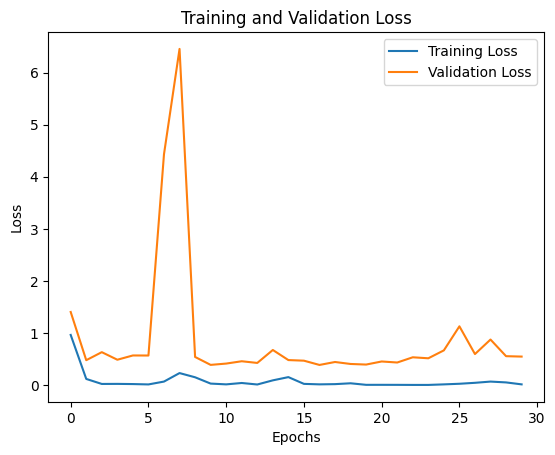

In [80]:
#plot training against validation loss
plt.plot(history_Rn50.history['loss'], label= 'Training Loss')

#Plots the validation loss as a line with label "Validation Loss".
plt.plot(history_Rn50.history['val_loss'], label='Validation Loss')

#Sets the title of the plot to "Training and Validation Loss".
plt.title('Training and Validation Loss')

#Sets the label of the x-axis to "Epochs".
plt.xlabel('Epochs')

#Sets the label of the y-axis to "Loss".
plt.ylabel('Loss')

#Shows the legend of the plot with the labels of the two lines.
plt.legend()

#Shows the plot on the screen.
plt.show()

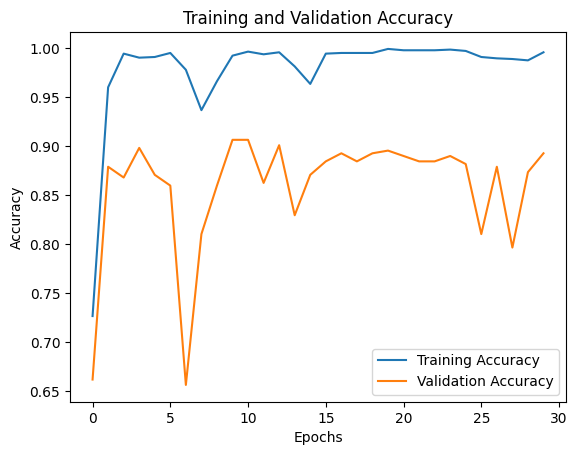

In [138]:
#Plots the training accuracy as a line with label "Training Accuracy".
plt.plot(history_Rn50.history['accuracy'], label='Training Accuracy')

#Plots the validation accuracy as a line with label "Validation Accuracy".
plt.plot(history_Rn50.history['val_accuracy'], label='Validation Accuracy')

#Sets the title of the plot to "Training and Validation Accuracy".
plt.title('Training and Validation Accuracy')

#Sets the label of the x-axis to "Epochs".
plt.xlabel('Epochs')

#Sets the label of the y-axis to "Accuracy".
plt.ylabel('Accuracy')

#Shows the legend of the plot with the labels of the two lines.
plt.legend()

#Shows the plot on the screen.
plt.show()

In [142]:
# Apply model_vgg to predict test images
predictions = model_Rn50.predict(test_imgs)

# Convert predicted probabilities to predicted labels
predicted_labels = np.argmax(predictions, axis=1)
class_label = ['healthy', 'multiple_diseases', 'rust', 'scab']
# Calculate the classification report
class_report = classification_report(test_labels, predicted_labels, target_names=class_label)

# Print the classification report
print("Classification Report:\n", class_report)

2/2 [==============================] - 0s 310ms/step
Classification Report:
                    precision    recall  f1-score   support

          healthy       0.33      1.00      0.49        21
multiple_diseases       0.00      0.00      0.00         1
             rust       0.00      0.00      0.00        29
             scab       0.00      0.00      0.00        13

         accuracy                           0.33        64
        macro avg       0.08      0.25      0.12        64
     weighted avg       0.11      0.33      0.16        64



In [141]:
print(predicted_labels)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


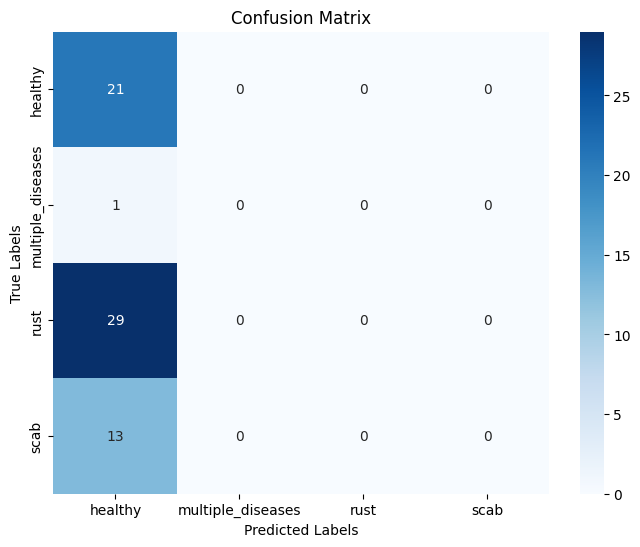

In [83]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the confusion matrix
conf_matrix = confusion_matrix(test_labels, predicted_labels)

# Define class labels (replace with your actual class labels)
class_label = ['healthy', 'multiple_diseases', 'rust', 'scab']

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_label, yticklabels=class_label)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

1/1 [==============================] - 0s 364ms/step
Test Image 1: Predicted Class = healthy


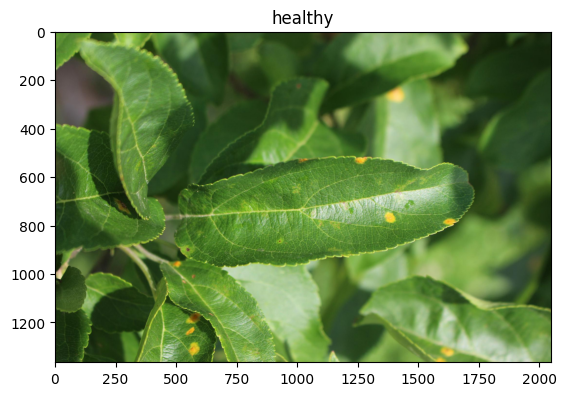

1/1 [==============================] - 0s 15ms/step
Test Image 2: Predicted Class = healthy


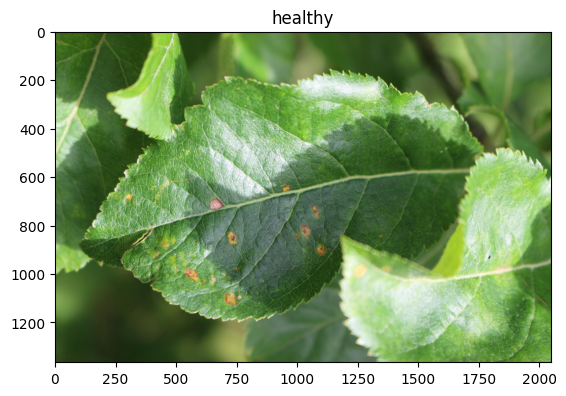

1/1 [==============================] - 0s 26ms/step
Test Image 3: Predicted Class = healthy


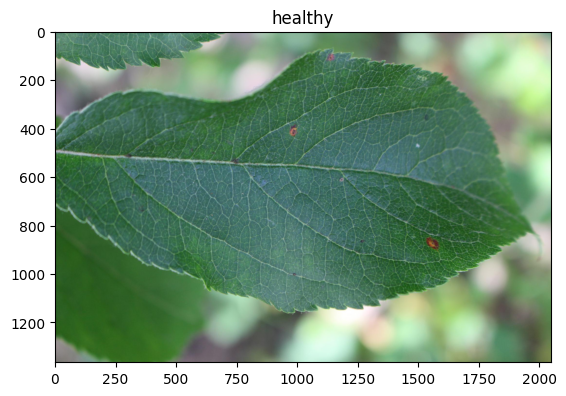

1/1 [==============================] - 0s 2ms/step
Test Image 4: Predicted Class = healthy


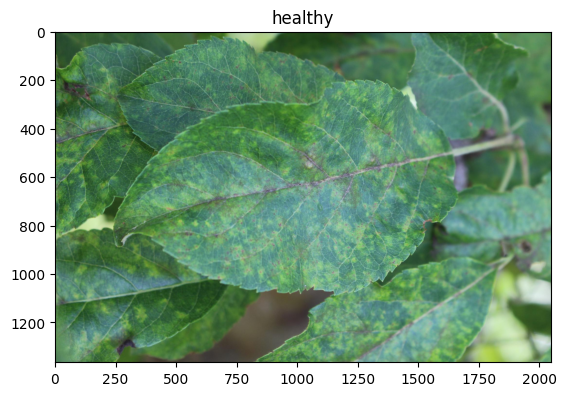

1/1 [==============================] - 0s 21ms/step
Test Image 5: Predicted Class = healthy


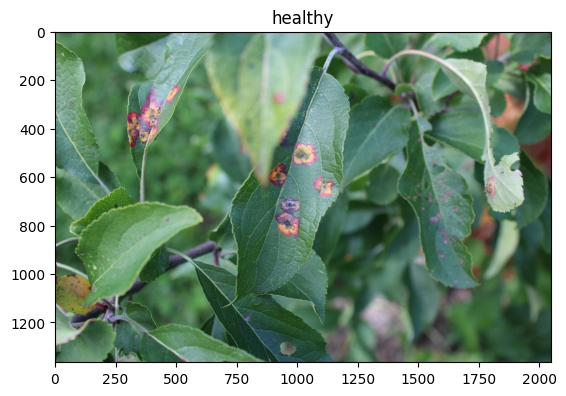

1/1 [==============================] - 0s 19ms/step
Test Image 6: Predicted Class = healthy


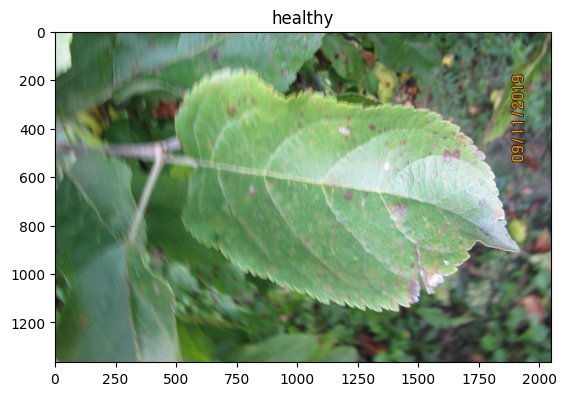

1/1 [==============================] - 0s 25ms/step
Test Image 7: Predicted Class = healthy


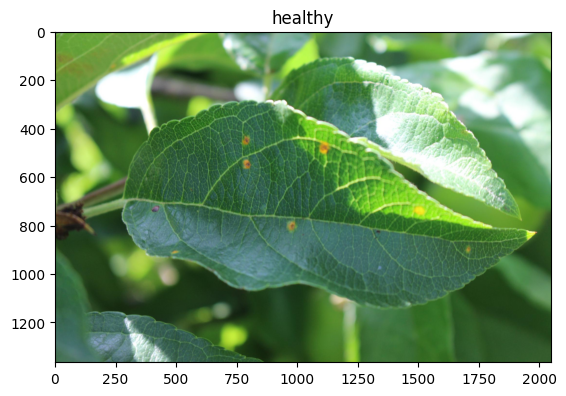

1/1 [==============================] - 0s 15ms/step
Test Image 8: Predicted Class = healthy


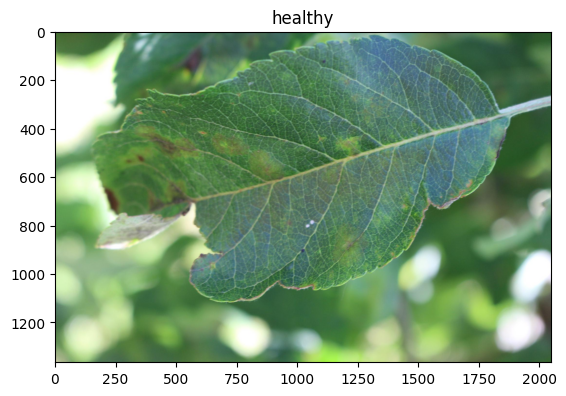

1/1 [==============================] - 0s 15ms/step
Test Image 9: Predicted Class = healthy


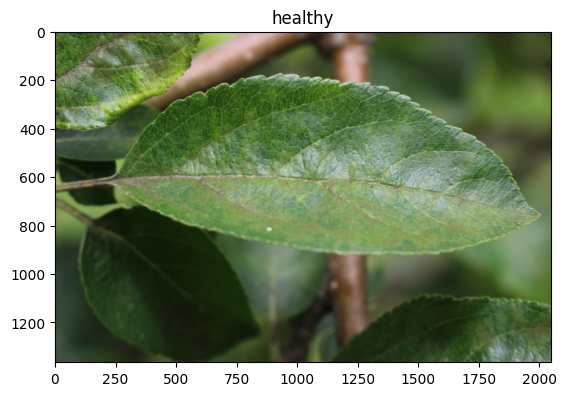

1/1 [==============================] - 0s 25ms/step
Test Image 10: Predicted Class = healthy


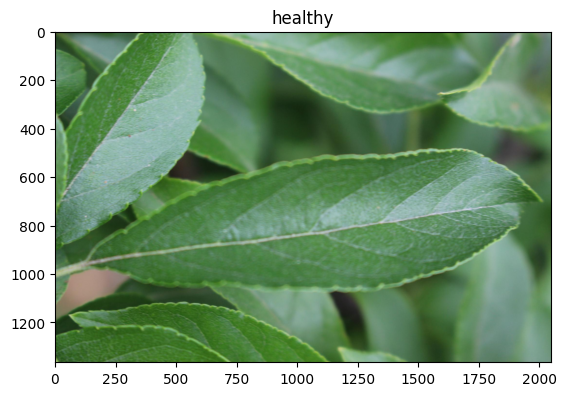

In [62]:
# Update 'categories' list with four class names
from tensorflow.keras.preprocessing import image
from PIL import Image
from pathlib import Path
from keras.preprocessing.image import ImageDataGenerator

categories = ['healthy', 'multiple_diseases', 'rust', 'scab']

test_dir = r"D:/Applied AI/test"
ground_truth_labels = []  # To store the actual class labels
predicted_labels = []  # To store the predicted class labels

num_images_to_display = 10  # Number of images to display and predict

for idx, img_path in enumerate(os.listdir(test_dir)):
    if idx >= num_images_to_display:
        break
    
    file_path = os.path.join(test_dir, img_path)
    test_img = image.load_img(file_path, target_size=(224, 224))
    test_img = image.img_to_array(test_img)
    test_img = test_img / 255
    test_img = np.expand_dims(test_img, axis=0)
    
    # Get the ground truth label from the image filename
    true_label = img_path.split("_")[0]  # Assuming the filenames are like 'class_imageID.jpg'
    ground_truth_labels.append(true_label)
    
    result = np.argmax(model_Rn50.predict(test_img), axis=-1)
    predicted_class = categories[result[0]]
    predicted_labels.append(predicted_class)
    
    print(f"Test Image {idx + 1}: Predicted Class = {predicted_class}")

    # Load and display the test image
    image_result = Image.open(file_path)
    plt.imshow(image_result)
    plt.title(predicted_class)
    plt.show()

## Building Novel Model

In [89]:
 # data Normalization and Augumentation
batch_size = 16
data_gen = ImageDataGenerator(rescale=1./255, shear_range = 0.2, zoom_range=0.2,
                                    horizontal_flip=True, vertical_flip=True, rotation_range=20, validation_split=0.2)

train_datagen = data_gen.flow_from_directory("D:/Applied AI/train",
                                             target_size= (img_size, img_size), batch_size = batch_size,
                                             class_mode = 'categorical', subset = 'training')

val_datagen = data_gen.flow_from_directory("D:/Applied AI/train",
                                             target_size= (img_size, img_size), batch_size = batch_size,
                                             class_mode = 'categorical', subset = 'validation')

Found 1458 images belonging to 4 classes.
Found 363 images belonging to 4 classes.


In [111]:
# clear session so model learns well
from tensorflow.keras import backend
backend.clear_session()

In [112]:
from tensorflow.python.ops.gen_nn_ops import conv2d
model = Sequential()
model.add(Conv2D(64, (3,3), activation='relu', padding='same', input_shape=(img_size, img_size,3)))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Flatten())
model.add(Dense(4, activation='softmax'))




In [113]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 64)        36928     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 28, 28, 64)       0

In [114]:
# comile the model
model.compile(optimizer=Adam(learning_rate = 0.0001), loss= 'categorical_crossentropy', metrics=['accuracy'])

In [115]:
check_point = ModelCheckpoint("D:/Applied AI/train/models/apple6.h5",
                              monitor='val_loss',
                              mode='min',
                              save_best_only= True,
                              vebose=1)
early_stopping = EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=10,
                              verbose=1,
                              restore_best_weights=True)
callbacks = [check_point, early_stopping]

In [116]:
model_history = model.fit(train_datagen, validation_data = val_datagen,
                                    epochs= 30, callbacks=[checkpoint, earlystop])

Epoch 1/30
92/92 [==============================] - 32s 338ms/step - loss: 1.2525 - accuracy: 0.3272 - val_loss: 1.2364 - val_accuracy: 0.3444
Epoch 2/30
92/92 [==============================] - 21s 230ms/step - loss: 1.2386 - accuracy: 0.3491 - val_loss: 1.2210 - val_accuracy: 0.3967
Epoch 3/30
92/92 [==============================] - 21s 226ms/step - loss: 1.2077 - accuracy: 0.4102 - val_loss: 1.1757 - val_accuracy: 0.4986
Epoch 4/30
92/92 [==============================] - 21s 228ms/step - loss: 1.1440 - accuracy: 0.4952 - val_loss: 1.0703 - val_accuracy: 0.6061
Epoch 5/30
92/92 [==============================] - 21s 229ms/step - loss: 1.0232 - accuracy: 0.6104 - val_loss: 0.9345 - val_accuracy: 0.6364
Epoch 6/30
92/92 [==============================] - 21s 227ms/step - loss: 0.9046 - accuracy: 0.6626 - val_loss: 0.8194 - val_accuracy: 0.6804
Epoch 7/30
92/92 [==============================] - 21s 229ms/step - loss: 0.8236 - accuracy: 0.6866 - val_loss: 0.7605 - val_accuracy: 0.7135

92/92 [==============================] - 21s 231ms/step - loss: 0.5463 - accuracy: 0.8032 - val_loss: 0.5521 - val_accuracy: 0.7824
Epoch 20/30
92/92 [==============================] - 21s 230ms/step - loss: 0.5449 - accuracy: 0.7915 - val_loss: 0.5477 - val_accuracy: 0.7989
Epoch 21/30
92/92 [==============================] - 21s 228ms/step - loss: 0.5019 - accuracy: 0.8176 - val_loss: 0.5113 - val_accuracy: 0.8154
Epoch 22/30
92/92 [==============================] - 22s 232ms/step - loss: 0.5105 - accuracy: 0.8237 - val_loss: 0.4863 - val_accuracy: 0.8209
Epoch 23/30
92/92 [==============================] - 22s 234ms/step - loss: 0.4815 - accuracy: 0.8299 - val_loss: 0.5556 - val_accuracy: 0.8099
Epoch 24/30
92/92 [==============================] - 21s 229ms/step - loss: 0.4766 - accuracy: 0.8422 - val_loss: 0.4479 - val_accuracy: 0.8567
Epoch 25/30
92/92 [==============================] - 21s 228ms/step - loss: 0.4568 - accuracy: 0.8560 - val_loss: 0.4888 - val_accuracy: 0.8182
Epoc

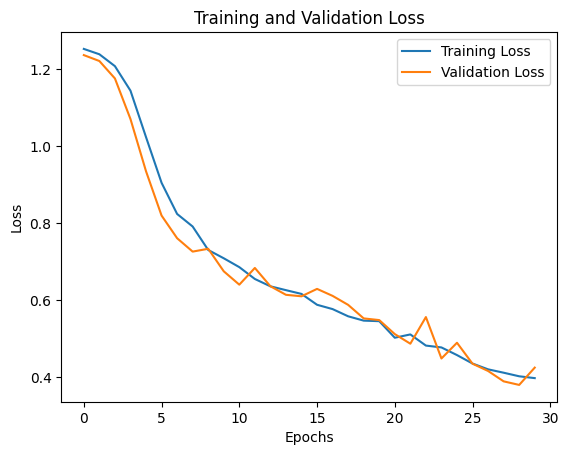

In [117]:
#check for overfitting
#plot training against validation loss
plt.plot(model_history.history['loss'], label= 'Training Loss')

#Plots the validation loss as a line with label "Validation Loss".
plt.plot(model_history.history['val_loss'], label='Validation Loss')

#Sets the title of the plot to "Training and Validation Loss".
plt.title('Training and Validation Loss')

#Sets the label of the x-axis to "Epochs".
plt.xlabel('Epochs')

#Sets the label of the y-axis to "Loss".
plt.ylabel('Loss')

#Shows the legend of the plot with the labels of the two lines.
plt.legend()

#Shows the plot on the screen.
plt.show()

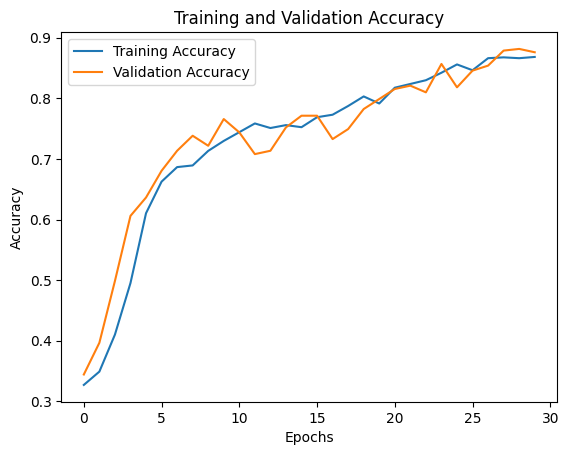

In [118]:
# Plot training and validation accuracy

#Plots the training accuracy as a line with label "Training Accuracy".
plt.plot(model_history.history['accuracy'], label='Training Accuracy')

#Plots the validation accuracy as a line with label "Validation Accuracy".
plt.plot(model_history.history['val_accuracy'], label='Validation Accuracy')

#Sets the title of the plot to "Training and Validation Accuracy".
plt.title('Training and Validation Accuracy')

#Sets the label of the x-axis to "Epochs".
plt.xlabel('Epochs')

#Sets the label of the y-axis to "Accuracy".
plt.ylabel('Accuracy')

#Shows the legend of the plot with the labels of the two lines.
plt.legend()

#Shows the plot on the screen.
plt.show()

In [119]:
# Apply model_vgg to predict test images
predictions = model.predict(test_imgs)

# Convert predicted probabilities to predicted labels
predicted_labels = np.argmax(predictions, axis=1)
class_label = ['healthy', 'multiple_diseases', 'rust', 'scab']
# Calculate the classification report
class_report = classification_report(test_labels, predicted_labels, target_names=class_label)

# Print the classification report
print("Classification Report:\n", class_report)

2/2 [==============================] - 0s 33ms/step
Classification Report:
                    precision    recall  f1-score   support

          healthy       0.78      1.00      0.88        21
multiple_diseases       0.00      0.00      0.00         1
             rust       0.93      0.97      0.95        29
             scab       1.00      0.54      0.70        13

         accuracy                           0.88        64
        macro avg       0.68      0.63      0.63        64
     weighted avg       0.88      0.88      0.86        64



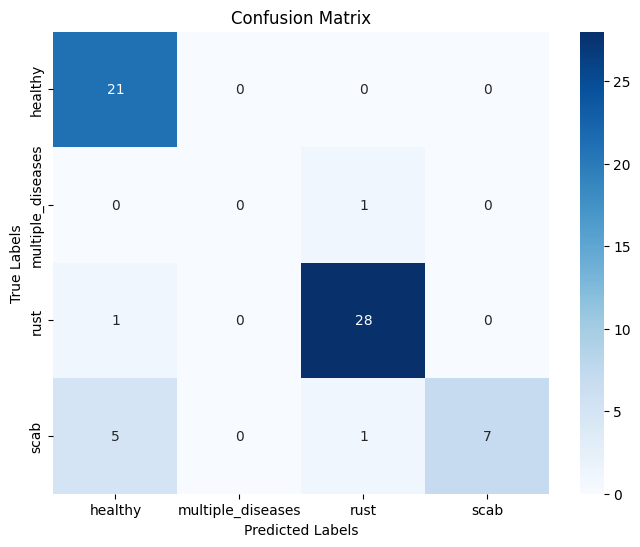

In [120]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the confusion matrix
conf_matrix = confusion_matrix(test_labels, predicted_labels)

# Define class labels (replace with your actual class labels)
class_label = ['healthy', 'multiple_diseases', 'rust', 'scab']

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_label, yticklabels=class_label)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

1/1 [==============================] - 0s 0s/step
Test Image 1: Predicted Class = rust


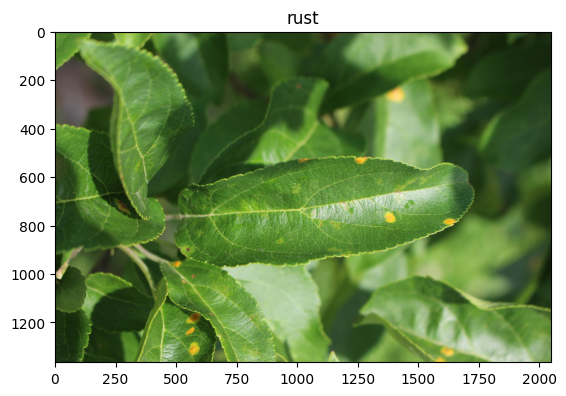

1/1 [==============================] - 0s 13ms/step
Test Image 2: Predicted Class = rust


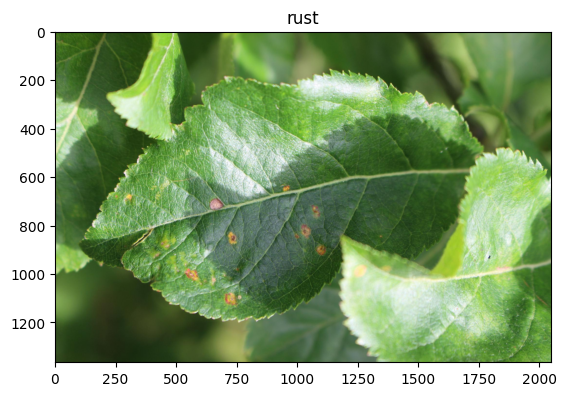

1/1 [==============================] - 0s 13ms/step
Test Image 3: Predicted Class = rust


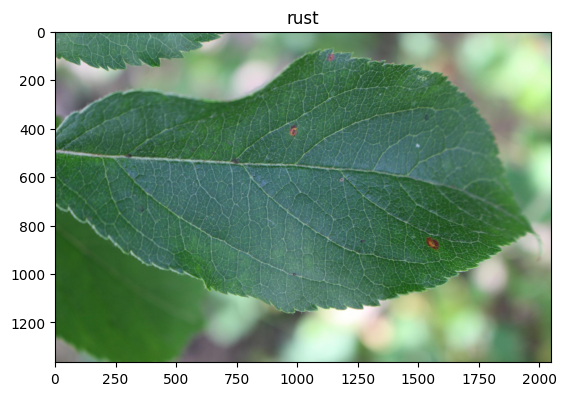

1/1 [==============================] - 0s 10ms/step
Test Image 4: Predicted Class = scab


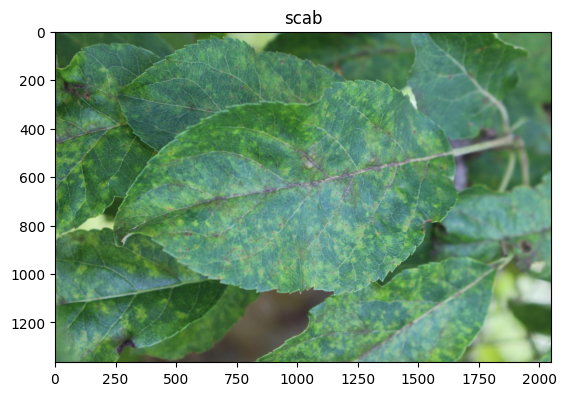

1/1 [==============================] - 0s 665us/step
Test Image 5: Predicted Class = rust


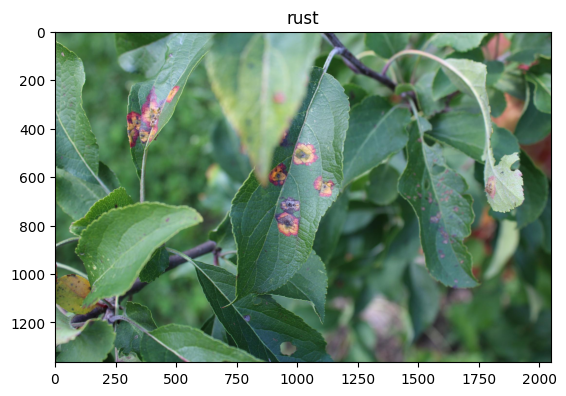

1/1 [==============================] - 0s 10ms/step
Test Image 6: Predicted Class = healthy


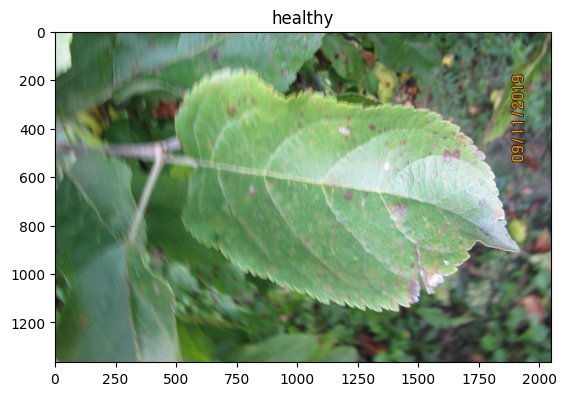

1/1 [==============================] - 0s 17ms/step
Test Image 7: Predicted Class = rust


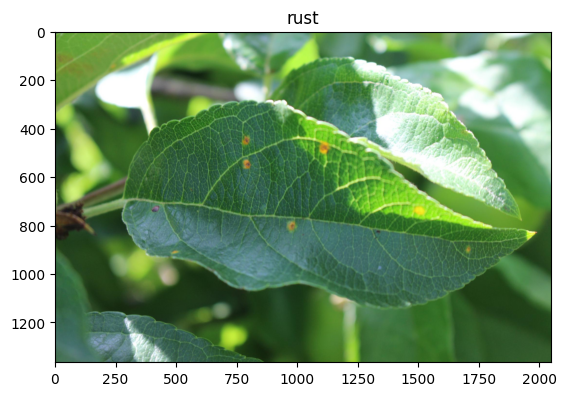

1/1 [==============================] - 0s 15ms/step
Test Image 8: Predicted Class = scab


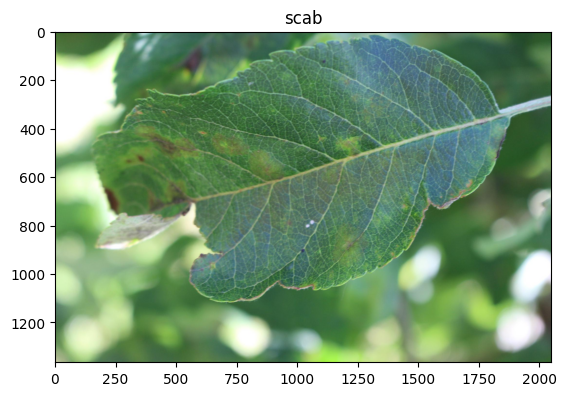

1/1 [==============================] - 0s 15ms/step
Test Image 9: Predicted Class = scab


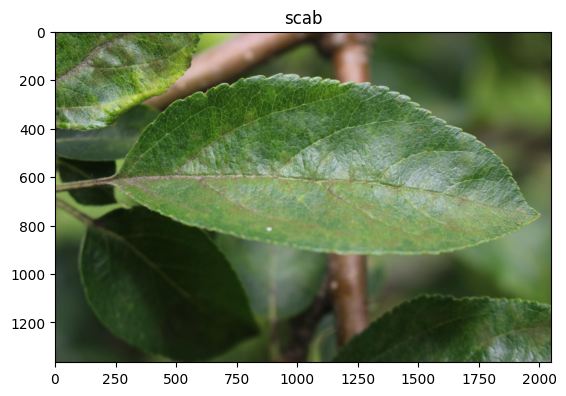

1/1 [==============================] - 0s 10ms/step
Test Image 10: Predicted Class = healthy


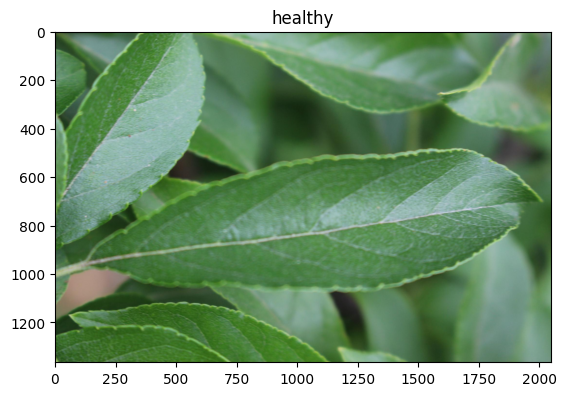

In [44]:
# Update 'categories' list with four class names
from tensorflow.keras.preprocessing import image
from PIL import Image
from pathlib import Path
from keras.preprocessing.image import ImageDataGenerator

categories = ['healthy', 'multiple_diseases', 'rust', 'scab']

test_dir = r"D:/Applied AI/test"
ground_truth_labels = []  # To store the actual class labels
predicted_labels = []  # To store the predicted class labels

num_images_to_display = 10  # Number of images to display and predict

for idx, img_path in enumerate(os.listdir(test_dir)):
    if idx >= num_images_to_display:
        break
    
    file_path = os.path.join(test_dir, img_path)
    test_img = image.load_img(file_path, target_size=(224, 224))
    test_img = image.img_to_array(test_img)
    test_img = test_img / 255
    test_img = np.expand_dims(test_img, axis=0)
    
    # Get the ground truth label from the image filename
    true_label = img_path.split("_")[0]  # Assuming the filenames are like 'class_imageID.jpg'
    ground_truth_labels.append(true_label)
    
    result = np.argmax(model.predict(test_img), axis=-1)
    predicted_class = categories[result[0]]
    predicted_labels.append(predicted_class)
    
    print(f"Test Image {idx + 1}: Predicted Class = {predicted_class}")

    # Load and display the test image
    image_result = Image.open(file_path)
    plt.imshow(image_result)
    plt.title(predicted_class)
    plt.show()


### Tunned Model

In [121]:
# clear session so model learns well
from tensorflow.keras import backend
backend.clear_session()

In [99]:
#  # data Normalization and Augumentation
# batch_size = 16
# data_gen = ImageDataGenerator(rescale=1./255, shear_range = 0.2, zoom_range=0.2,
#                                     horizontal_flip=True, vertical_flip=True, rotation_range=20, validation_split=0.2)

# train_datagen = data_gen.flow_from_directory("D:/Applied AI/train",
#                                              target_size= (img_size, img_size), batch_size = batch_size,
#                                              class_mode = 'categorical', subset = 'training')

# val_datagen = data_gen.flow_from_directory("D:/Applied AI/train",
#                                              target_size= (img_size, img_size), batch_size = batch_size,
#                                              class_mode = 'categorical', subset = 'validation')

Found 1458 images belonging to 4 classes.
Found 363 images belonging to 4 classes.


In [122]:
from tensorflow.python.ops.gen_nn_ops import conv2d
model2 = Sequential()
model2.add(Conv2D(64, (3,3), activation='relu', padding='same', input_shape=(img_size, img_size,3)))
model2.add(MaxPooling2D(2,2))
model2.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model2.add(MaxPooling2D(2,2))
model2.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model2.add(MaxPooling2D(2,2))
model2.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model2.add(MaxPooling2D(2,2))
model2.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model2.add(MaxPooling2D(2,2))
model2.add(Flatten())
model2.add(Dense(4, activation='softmax'))



In [123]:
model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 64)        36928     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 28, 28, 64)       0

In [124]:
 # data Normalization and Augumentation
batch_size = 16
data_gen = ImageDataGenerator(rescale=1./255, shear_range = 0.2, zoom_range=0.2,
                                    horizontal_flip=True, vertical_flip=True, rotation_range=20, validation_split=0.2)

train_datagen = data_gen.flow_from_directory("D:/Applied AI/train",
                                             target_size= (img_size, img_size), batch_size = batch_size,
                                             class_mode = 'categorical', subset = 'training')

val_datagen = data_gen.flow_from_directory("D:/Applied AI/train",
                                             target_size= (img_size, img_size), batch_size = batch_size,
                                             class_mode = 'categorical', subset = 'validation')

Found 1458 images belonging to 4 classes.
Found 363 images belonging to 4 classes.


In [125]:
# comile the model
model2.compile(optimizer=Adam(learning_rate = 0.0001), loss= 'categorical_crossentropy', metrics=['accuracy'])

In [126]:
check_point = ModelCheckpoint("D:/Applied AI/train/models/apple2.h5",
                              monitor='val_loss',
                              mode='min',
                              save_best_only= True,
                              vebose=1)
early_stopping = EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=10,
                              verbose=1,
                              restore_best_weights=True)
callbacks = [check_point, early_stopping]

In [127]:
model2_history = model2.fit(train_datagen, validation_data = val_datagen,
                                    epochs= 30, callbacks=[checkpoint, earlystop])

Epoch 1/30
92/92 [==============================] - 23s 241ms/step - loss: 1.2617 - accuracy: 0.3148 - val_loss: 1.2413 - val_accuracy: 0.3251
Epoch 2/30
92/92 [==============================] - 22s 237ms/step - loss: 1.2387 - accuracy: 0.3395 - val_loss: 1.2370 - val_accuracy: 0.3499
Epoch 3/30
92/92 [==============================] - 22s 239ms/step - loss: 1.2285 - accuracy: 0.3642 - val_loss: 1.2197 - val_accuracy: 0.4353
Epoch 4/30
92/92 [==============================] - 22s 235ms/step - loss: 1.2179 - accuracy: 0.3937 - val_loss: 1.2107 - val_accuracy: 0.4270
Epoch 5/30
92/92 [==============================] - 22s 238ms/step - loss: 1.1841 - accuracy: 0.4712 - val_loss: 1.1630 - val_accuracy: 0.4848
Epoch 6/30
92/92 [==============================] - 22s 236ms/step - loss: 1.1359 - accuracy: 0.5110 - val_loss: 1.1256 - val_accuracy: 0.5565
Epoch 7/30
92/92 [==============================] - 22s 236ms/step - loss: 1.0443 - accuracy: 0.5864 - val_loss: 0.9812 - val_accuracy: 0.6198

92/92 [==============================] - 22s 237ms/step - loss: 0.5607 - accuracy: 0.7963 - val_loss: 0.5585 - val_accuracy: 0.7741
Epoch 20/30
92/92 [==============================] - 22s 237ms/step - loss: 0.5507 - accuracy: 0.7894 - val_loss: 0.6229 - val_accuracy: 0.7741
Epoch 21/30
92/92 [==============================] - 22s 236ms/step - loss: 0.5477 - accuracy: 0.8011 - val_loss: 0.5442 - val_accuracy: 0.7769
Epoch 22/30
92/92 [==============================] - 22s 235ms/step - loss: 0.5105 - accuracy: 0.8134 - val_loss: 0.4962 - val_accuracy: 0.8182
Epoch 23/30
92/92 [==============================] - 22s 236ms/step - loss: 0.5064 - accuracy: 0.8258 - val_loss: 0.4718 - val_accuracy: 0.8264
Epoch 24/30
92/92 [==============================] - 22s 236ms/step - loss: 0.4818 - accuracy: 0.8313 - val_loss: 0.4510 - val_accuracy: 0.8292
Epoch 25/30
92/92 [==============================] - 22s 236ms/step - loss: 0.4598 - accuracy: 0.8333 - val_loss: 0.4378 - val_accuracy: 0.8650
Epoc

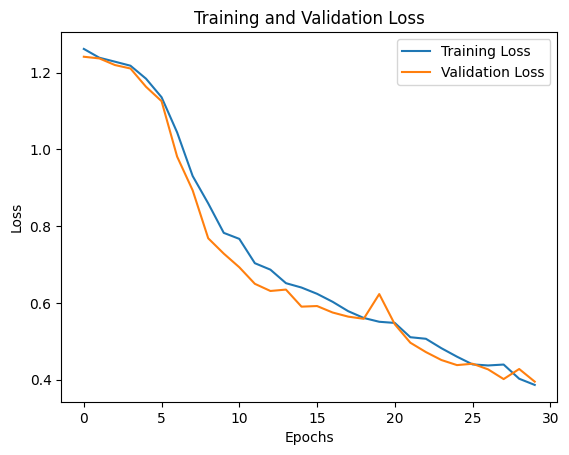

In [128]:
#check for overfitting
#plot training against validation loss
plt.plot(model2_history.history['loss'], label= 'Training Loss')

#Plots the validation loss as a line with label "Validation Loss".
plt.plot(model2_history.history['val_loss'], label='Validation Loss')

#Sets the title of the plot to "Training and Validation Loss".
plt.title('Training and Validation Loss')

#Sets the label of the x-axis to "Epochs".
plt.xlabel('Epochs')

#Sets the label of the y-axis to "Loss".
plt.ylabel('Loss')

#Shows the legend of the plot with the labels of the two lines.
plt.legend()

#Shows the plot on the screen.
plt.show()

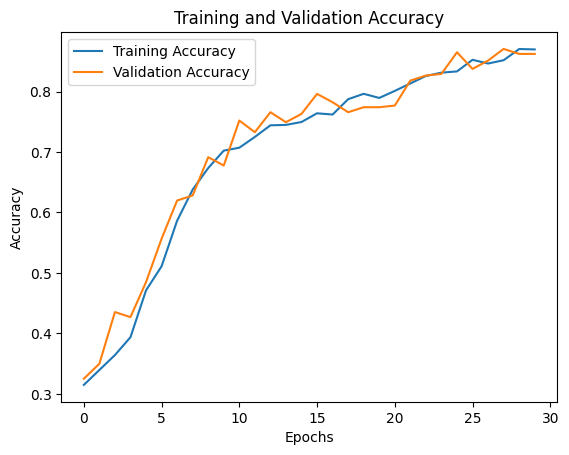

In [129]:
# Plot training and validation accuracy

#Plots the training accuracy as a line with label "Training Accuracy".
plt.plot(model2_history.history['accuracy'], label='Training Accuracy')

#Plots the validation accuracy as a line with label "Validation Accuracy".
plt.plot(model2_history.history['val_accuracy'], label='Validation Accuracy')

#Sets the title of the plot to "Training and Validation Accuracy".
plt.title('Training and Validation Accuracy')

#Sets the label of the x-axis to "Epochs".
plt.xlabel('Epochs')

#Sets the label of the y-axis to "Accuracy".
plt.ylabel('Accuracy')

#Shows the legend of the plot with the labels of the two lines.
plt.legend()

#Shows the plot on the screen.
plt.show()

In [130]:
# Apply model_vgg to predict test images
predictions = model2.predict(test_imgs)

# Convert predicted probabilities to predicted labels
predicted_labels = np.argmax(predictions, axis=1)
class_label = ['healthy', 'multiple_diseases', 'rust', 'scab']
# Calculate the classification report
class_report = classification_report(test_labels, predicted_labels, target_names=class_label)

# Print the classification report
print("Classification Report:\n", class_report)

2/2 [==============================] - 0s 8ms/step
Classification Report:
                    precision    recall  f1-score   support

          healthy       0.84      1.00      0.91        21
multiple_diseases       0.00      0.00      0.00         1
             rust       0.97      1.00      0.98        29
             scab       1.00      0.69      0.82        13

         accuracy                           0.92        64
        macro avg       0.70      0.67      0.68        64
     weighted avg       0.92      0.92      0.91        64



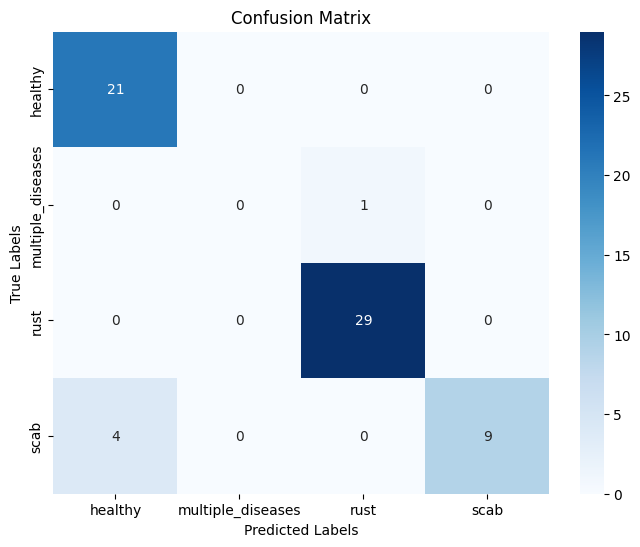

In [131]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the confusion matrix
conf_matrix = confusion_matrix(test_labels, predicted_labels)

# Define class labels (replace with your actual class labels)
class_label = ['healthy', 'multiple_diseases', 'rust', 'scab']

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_label, yticklabels=class_label)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

1/1 [==============================] - 0s 370ms/step
Test Image 1: Predicted Class = rust


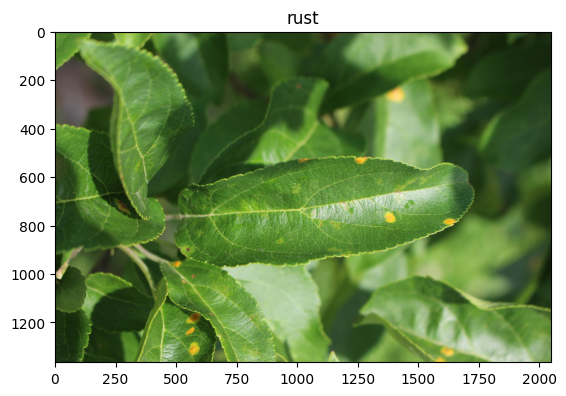

1/1 [==============================] - 0s 9ms/step
Test Image 2: Predicted Class = rust


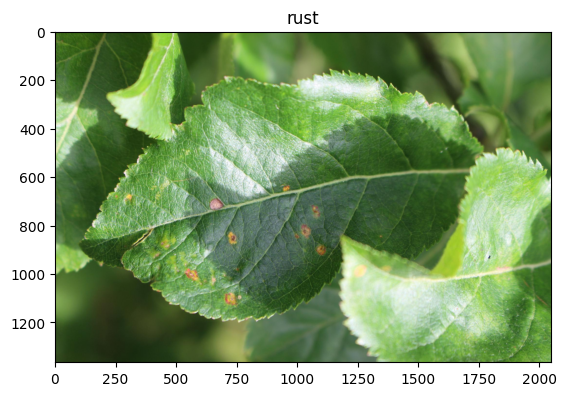

1/1 [==============================] - 0s 15ms/step
Test Image 3: Predicted Class = rust


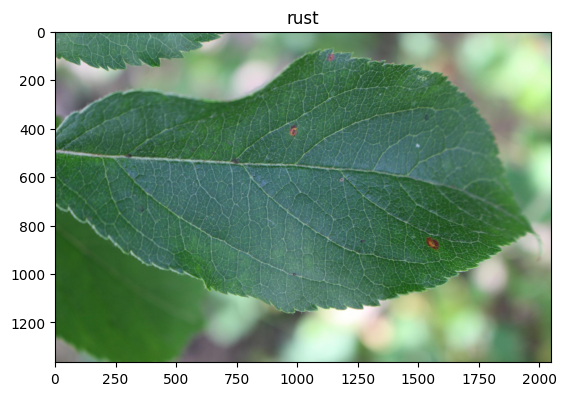

1/1 [==============================] - 0s 9ms/step
Test Image 4: Predicted Class = scab


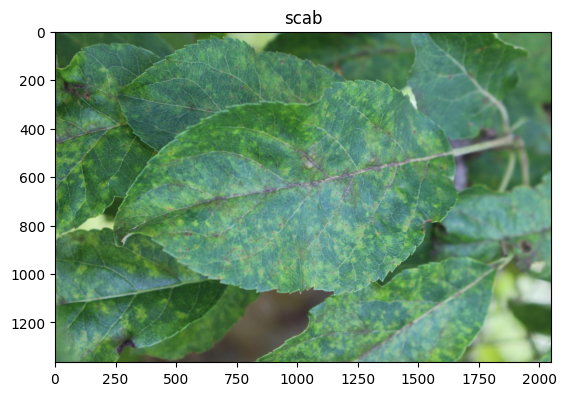

1/1 [==============================] - 0s 973us/step
Test Image 5: Predicted Class = rust


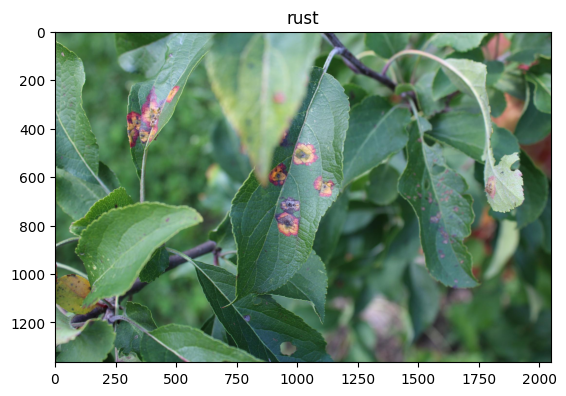

1/1 [==============================] - 0s 9ms/step
Test Image 6: Predicted Class = healthy


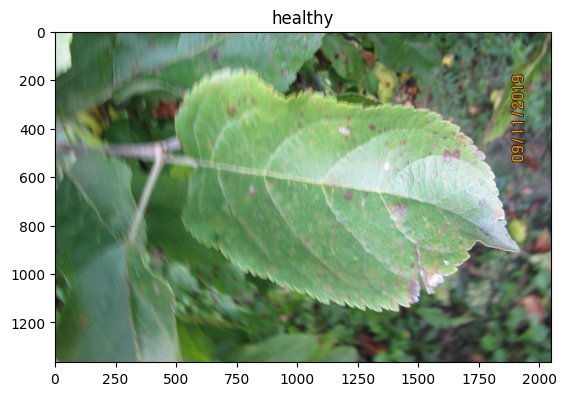

1/1 [==============================] - 0s 9ms/step
Test Image 7: Predicted Class = rust


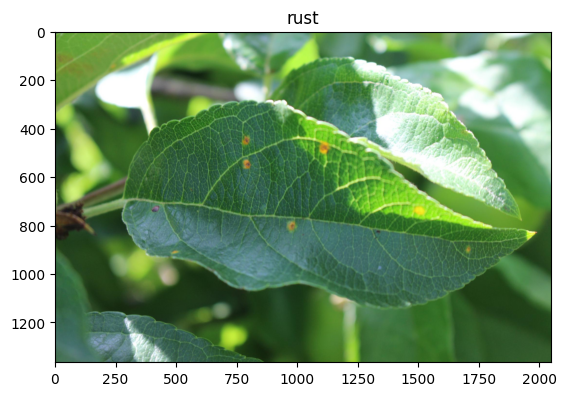

1/1 [==============================] - 0s 16ms/step
Test Image 8: Predicted Class = scab


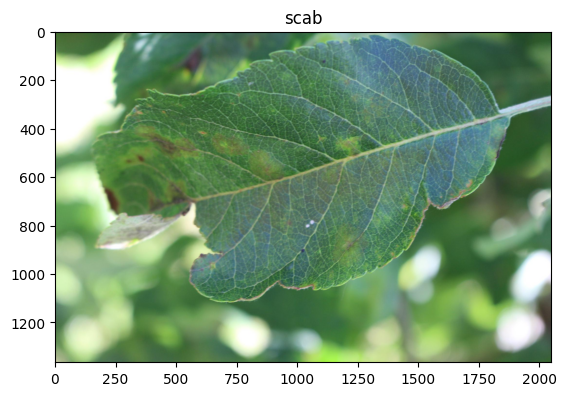

1/1 [==============================] - 0s 3ms/step
Test Image 9: Predicted Class = scab


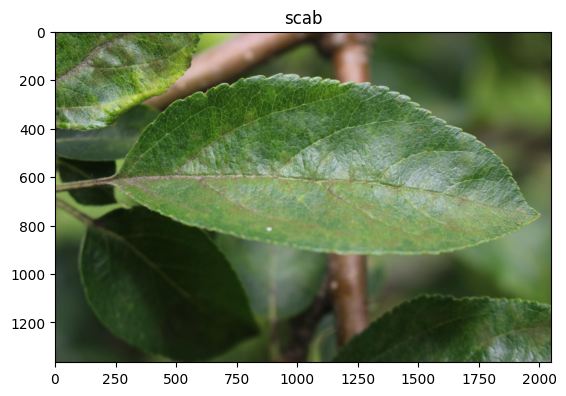

1/1 [==============================] - 0s 16ms/step
Test Image 10: Predicted Class = healthy


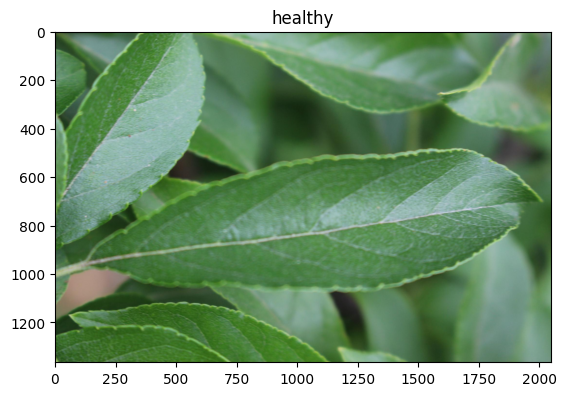

In [78]:
# Update 'categories' list with four class names
from tensorflow.keras.preprocessing import image
from PIL import Image
from pathlib import Path
from keras.preprocessing.image import ImageDataGenerator

categories = ['healthy', 'multiple_diseases', 'rust', 'scab']

test_dir = r"D:/Applied AI/test"
ground_truth_labels = []  # To store the actual class labels
predicted_labels = []  # To store the predicted class labels

num_images_to_display = 10  # Number of images to display and predict

for idx, img_path in enumerate(os.listdir(test_dir)):
    if idx >= num_images_to_display:
        break
    
    file_path = os.path.join(test_dir, img_path)
    test_img = image.load_img(file_path, target_size=(224, 224))
    test_img = image.img_to_array(test_img)
    test_img = test_img / 255
    test_img = np.expand_dims(test_img, axis=0)
    
    # Get the ground truth label from the image filename
    true_label = img_path.split("_")[0]  # Assuming the filenames are like 'class_imageID.jpg'
    ground_truth_labels.append(true_label)
    
    result = np.argmax(model2.predict(test_img), axis=-1)
    predicted_class = categories[result[0]]
    predicted_labels.append(predicted_class)
    
    print(f"Test Image {idx + 1}: Predicted Class = {predicted_class}")

    # Load and display the test image
    image_result = Image.open(file_path)
    plt.imshow(image_result)
    plt.title(predicted_class)
    plt.show()